In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython
import numpy as np
import pandas as pd
import scipy
import gseapy
import sklearn

sc.settings.figdir=os.path.expanduser('~/WbFigures/DevTelAnalysis')
sc._settings.settings._vector_friendly=True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis
from genomics import anndata_utils


import sys
import antipode
import antipode.antipode_model
import antipode.model_functions
import antipode.plotting
import antipode.post

from antipode.post import uniqlist

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is available
Number of GPUs: 1
GPU Name: NVIDIA A100-PCIE-40GB


In [21]:
model_path='/home/matthew.schmitz/Matthew/models/1.9.1.8.3_Dev-Free-Tel/'
#adata=sc.read_h5ad(os.path.join(model_path,'p3_adata.h5ad'),backed='r')
antipode_model=antipode.antipode_model.ANTIPODE.load(model_path,prefix='p3_',device=device,load_kw_args={'backed': None})#adata=adata
adata=antipode_model.adata_manager.adata
adata.obs.index=adata.obs.index.to_series().str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)
adata.obs_names_make_unique()

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/scvi/data/fields/_dataframe_field.py:183: UserWarning: Category 63 in adata.obs['_scvi_batch_ind'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


In [22]:
adata

AnnData object with n_obs × n_vars = 995358 × 16738
    obs: 'n_genes', 'batch_name', 'dataset_name', 'timepoint', 'region', 'clean_cellname', 'full_cellname', 'msregion', 'general_region', 'species', 'percent_ribo', 'n_counts', 'log10_n_counts', 'individual', 'singlet', 'doublet', 'S_score', 'G2M_score', 'phase', '_scvi_discov_ind', '_scvi_batch_ind', 'psi_0', 'psi_1', 'psi_2', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster', 'neighborhood', 'curated_class_label', 'female', 'log_n_genes', 'kmeans'
    var: 'n_cells', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std', 'highly_variable_rank', 'variances', 'variances_norm', 'means', 'q_gene', 'q_gene_size', 'q_left_flank', 'q_right_flank', 'q_syntenic', 'm_gene', 'm_gene_size', 'm_left_flank', 'm_right_flank', 'm_syntenic', 'h_gene', 'h_gene_size', 'h_left_flank', 'h_right_flank', 'h_syntenic', 'neighborhood_jaccard_human_macaque', 'neighborhood_jaccard_macaque_mouse', 'neighborho

In [4]:
import rapids_singlecell as rsc
dim_weights=np.absolute(adata.uns['param_store']['z_decoder_weight']).mean(1)
#adata.obsm['X_weighted_antipode']=adata.obsm['X_antipode']*dim_weights
rsc.pp.neighbors(adata, n_neighbors=50, use_rep='X_antipode')
rsc.tl.umap(adata,spread=3.,min_dist=0.)
adata.obsm['X_umap']=antipode.plotting.clip_latent_dimensions(adata.obsm['X_umap'],0.01)
np.savetxt(os.path.join(model_path,"X_umap.csv"), adata.obsm['X_umap'], delimiter=",")
print('done')

done


In [5]:
#adata=adata.to_memory()

In [6]:
#For PyComplexHeatmap need to register palettes
gs1=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102,name='godsnot_102')
matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
gs2=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102,name='godsnot_big')
matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)
bog=matplotlib.colors.ListedColormap(list(adata.uns['species_color_dict'].values()),name='bog')
matplotlib.cm.register_cmap(name='bog',cmap=bog)

/scratch/fast/17177540/ipykernel_230715/2840506100.py:3: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
/scratch/fast/17177540/ipykernel_230715/2840506100.py:5: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)
/scratch/fast/17177540/ipykernel_230715/2840506100.py:7: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='bog',cmap=bog)


In [23]:
batch_key='batch_name'
discov_key='species'
layer_key='spliced'
MDE_KEY = "X_antipode_MDE"

In [24]:
adata.uns['region_colors']=[adata.uns['region_colors_dict'][x] for x in adata.obs['region'].cat.categories]
adata.uns['general_region_colors']=[adata.uns['general_region_color_dict'][x] for x in adata.obs['general_region'].cat.categories]
adata.uns['species_colors']=[adata.uns['species_color_dict'][x] for x in adata.obs['species'].cat.categories]
adata.obsm['X_umap']=np.loadtxt(os.path.join(model_path,"X_umap.csv"), delimiter=",")
curateds=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_Dev-Free/obs.tsv',index_col=0,sep='\t')
curateds=curateds.rename(dict(zip(curateds.columns ,['wb_'+str(x) for x in curateds.columns])),axis=1)
adata.obs.loc[:,curateds.columns]=curateds.astype('string')
adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])

/scratch/fast/17177540/ipykernel_230715/3322001473.py:5: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  curateds=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_Dev-Free/obs.tsv',index_col=0,sep='\t')
/scratch/fast/17177540/ipykernel_230715/3322001473.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])
/scratch/fast/17177540/ipykernel_230715/3322001473.py:8: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, repl

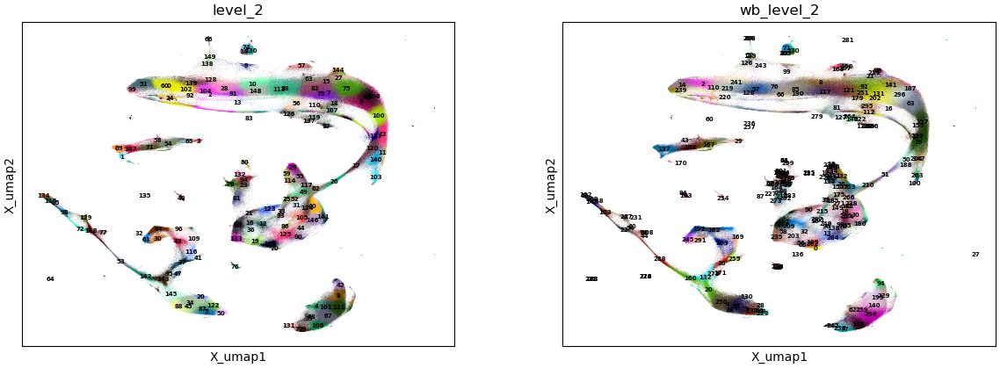

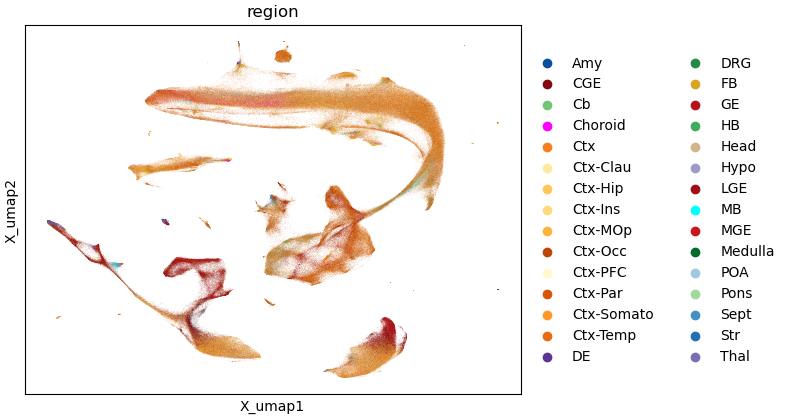

In [9]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['level_2','wb_level_2'],
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['region']
)

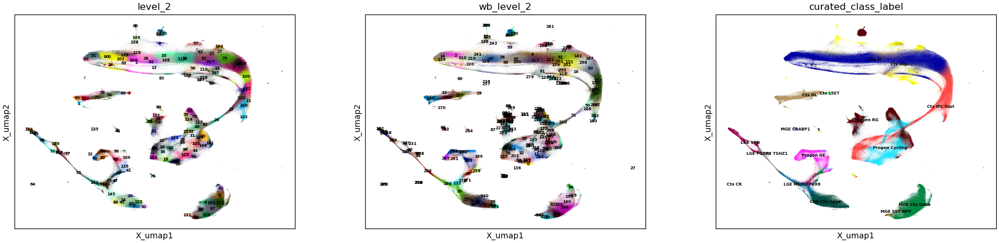

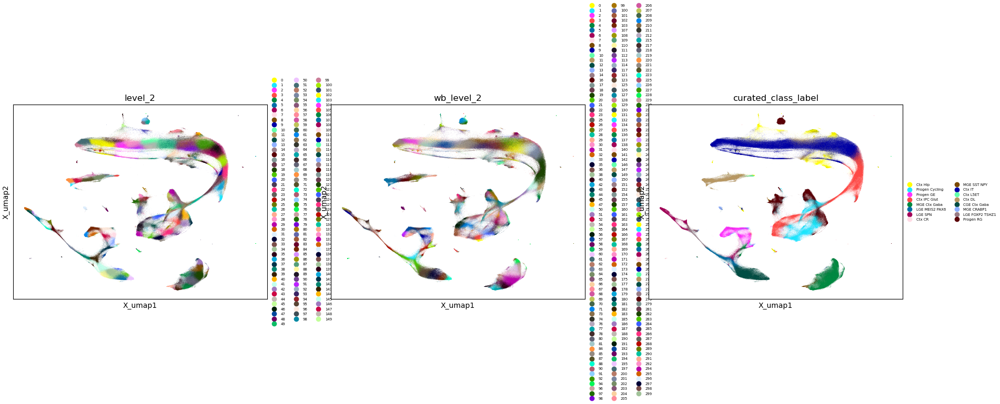

In [10]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['level_2','wb_level_2','curated_class_label'],
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['level_2','wb_level_2','curated_class_label'],
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5
)


In [25]:
wb_markers=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_Dev-Free/dev_level2_99quant_markers.csv',sep='\t',index_col=0)

In [26]:
wb_markers

,TRAPPC2,C17orf49,C2orf68,C4orf19,C4orf54,C11orf58,C9orf24,C11orf1,C3orf80,C8orf33,...,ZW10,ZWILCH,ZWINT,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ASIP,CCDC198
101,-0.172266,-1.243906,0.129060,-0.864464,-0.573992,-0.681300,-2.732248,-0.761313,-1.146334,-0.313072,...,-0.382399,-1.188742,-2.100093,0.227686,-0.329126,0.102656,-0.637393,0.108812,-1.797277,-0.348910
290,-0.277781,-1.375687,0.164253,-1.117764,-0.128186,-0.834255,-3.125630,-0.942913,-0.611823,-0.355978,...,-0.189230,-0.996098,-2.045319,0.006864,0.403852,0.011922,-0.601036,0.510646,-1.487849,-1.547511
207,-0.243354,-1.024208,-0.124642,-1.303963,-0.593878,-0.482568,-2.958297,-0.644367,-1.242568,-0.398263,...,-0.495191,-1.157688,-1.836608,-0.018278,-0.602906,0.082134,-0.847383,0.041703,-1.254011,-1.511600
99,-0.262051,-1.054807,0.093357,-1.457755,-0.171788,-0.671277,-2.790665,-0.812533,-1.083600,-0.391561,...,-0.480869,-0.876005,-2.498251,-0.107939,-0.543068,-0.074748,-1.034128,-0.033443,-1.428847,-1.478866
243,-0.370951,-0.795169,-0.144994,-1.327471,-0.073021,-0.648945,-2.616985,-0.731515,-1.084080,-0.470387,...,-0.588196,-0.879090,-2.214118,-0.297998,-0.683909,-0.092175,-0.736334,-0.181116,-1.402434,-1.640308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,-0.156896,-0.092633,-0.941357,-1.235610,-1.075418,-0.135038,-1.872038,-0.159963,-1.044379,-0.272443,...,-0.920579,-0.656229,-1.270706,-0.943268,-1.176174,-0.410543,-0.716486,-1.362881,-0.757430,-1.464645
170,-0.222882,-0.277074,-0.945841,-0.927761,-0.947632,-0.277627,-1.676337,-0.276471,-0.717525,-0.369014,...,-0.854663,-0.472264,-1.078010,-0.818834,-0.777589,-0.356571,-0.698395,-1.064766,-0.697879,-1.076109
23,-0.441124,-0.913052,-0.076998,-1.175039,0.431381,-0.258234,0.951990,-0.161081,-1.951680,-0.197459,...,-0.908764,-1.301441,-2.480541,-0.450240,-0.035239,-0.447296,-0.926205,-0.629552,-1.386964,-1.083689
244,-0.193394,-0.639647,-0.184355,-1.288568,0.881612,-0.092827,0.491645,-0.096596,-1.526750,-0.100775,...,-0.819104,-0.519528,-1.359769,-0.483992,0.227236,-0.748068,-1.113454,-0.870803,-1.125958,-1.414567


In [27]:
prefix=''
pstore=adata.uns['param_store']
n_clusters=antipode_model.level_sizes[-1]
level_edges=[antipode.model_functions.numpy_hardmax(antipode_model.adata_manager.adata.uns[prefix+'param_store']['edges_'+str(i)],axis=-1) for i in range(len(antipode_model.level_sizes)-1)]
levels=antipode_model.tree_convergence_bottom_up.just_propagate(np.eye(antipode_model.level_sizes[-1]),level_edges)
prop_taxon=np.concatenate(levels,axis=-1)

discov_labels=adata.obs[antipode_model.discov_key].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
cluster_index=adata.obs['level_2'].cat.categories.astype(int)#list(range(antipode_model.level_sizes[-1]))#list(range(pstore['locs'].shape[0]))
cluster_labels=list(adata.obs['level_2'].cat.categories)
cluster_label_dict=dict(zip(cluster_index,cluster_labels))
var_labels=adata.var.index

prop_locs=prop_taxon@pstore['locs']
prop_cluster_intercept=prop_taxon@pstore['cluster_intercept']
cluster_params=(prop_locs@pstore['z_decoder_weight'])+prop_cluster_intercept+np.mean(pstore['discov_constitutive_de'],0,keepdims=True)
cluster_params=cluster_params[cluster_index,:]

#Need to propagate multilayer tree to discovs
prop_discov_di = np.einsum('pc,dcg->dpg',prop_taxon,pstore['discov_di'])
prop_discov_dm = np.einsum('pc,dcm->dpm',prop_taxon,pstore['discov_dm'])
discov_cluster_params=np.einsum('dpm,dmg->dpg',prop_locs+prop_discov_dm,pstore['z_decoder_weight']+pstore['discov_dc'])+(prop_cluster_intercept+prop_discov_di+np.expand_dims(pstore['discov_constitutive_de'],1))
discov_cluster_params=discov_cluster_params

In [28]:
loc_df=pd.DataFrame(prop_locs[cluster_index,:],index=cluster_labels,columns=latent_labels)
leaf_loc_df=pd.DataFrame(pstore['locs'][cluster_index,:],index=cluster_labels,columns=latent_labels)
loc_df=loc_df+(np.random.standard_normal(loc_df.shape)*1e-10)
loc_df.index.name='level_2'


In [29]:
adata.obs['level_2']=adata.obs['level_2'].astype('string')
adata.obs['level_2']=adata.obs['level_2'].astype('category')
adata.obs['level_2']

TAGTATGTAATA_e14-WT8                                                                     70
CCTCCAATTGGC_e14-WT8                                                                     24
CAGCCGCGCCCT_e14-WT8                                                                    119
TACACGGCCACT_e14-WT8                                                                    137
CTTGGGATTAGC_e14-WT8                                                                    126
                                                                                       ... 
TTGGAACAGTGAATTG_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut    140
TTGTAGGGTTCGCGAC_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut     89
TTTATGCCAATCAGAA_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut     21
TTTATGCGTATGGTTC_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut     21
TTTGCGCTCGTAGATC_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_

In [30]:
ordering=list(adata.obs.groupby('level_2')['neighborhood'].value_counts().unstack().idxmax(1).sort_values().index)

def add_linkage_adata(adata,df,groupby,cluster_labels,method='average',metric='cityblock',optimal_ordering=False):
    dend_key='dendrogram_'+groupby
    row_linkage=scipy.cluster.hierarchy.linkage(df,method=method,metric=metric,optimal_ordering=optimal_ordering)
    adata.uns[dend_key]={}
    adata.uns[dend_key]['linkage']=row_linkage
    adata.uns[dend_key]['groupby']=[groupby]
    adata.uns[dend_key]['use_rep']=''
    adata.uns[dend_key]['cor_method']=metric
    adata.uns[dend_key]['linkage_method']=method
    adata.uns[dend_key]['categories_idx_ordered']=scipy.cluster.hierarchy.leaves_list(row_linkage)
    adata.uns[dend_key]['categories_ordered']=pd.Series(cluster_labels)[adata.uns['dendrogram_level_2']['categories_idx_ordered']].to_list()
    adata.uns[dend_key]['dendrogram_info']=scipy.cluster.hierarchy.dendrogram(adata.uns['dendrogram_level_2']['linkage'], no_plot=True)

add_linkage_adata(adata,loc_df,groupby='level_2',cluster_labels=cluster_labels,optimal_ordering=ordering)
#adata.obs['level_2']=adata.obs['level_2'].cat.reorder_categories(pd.Series(sorted(adata.obs['level_2'].cat.categories))[adata.uns['dendrogram_level_2']['categories_idx_ordered']])
adata.obs['level_2']=adata.obs['level_2'].cat.reorder_categories(adata.obs['level_2'].cat.categories[adata.uns['dendrogram_level_2']['categories_idx_ordered']])
ccdict=adata.obs.groupby('level_2')['curated_class_label'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['curated_class_label']=adata.obs['curated_class_label'].astype('string').astype('category')
#adata.obs['curated_class_label']=adata.obs['curated_class_label'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs['level_2'].cat.categories]))

ccdict=adata.obs.groupby('level_2')['neighborhood'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['neighborhood']=adata.obs['neighborhood'].astype('string').astype('category')
adata.obs['neighborhood']=adata.obs['neighborhood'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs['level_2'].cat.categories]))

ccdict=adata.obs.groupby('level_2')['phase'].value_counts().unstack().idxmax(1).to_dict()
adata.obs['phase']=adata.obs['phase'].astype('string').astype('category')
adata.obs['phase']=adata.obs['phase'].cat.reorder_categories(uniqlist([ccdict[x] for x in adata.obs['level_2'].cat.categories]))
color_dict={'G1':'dodgerblue', 'S':'darkorange', 'G2M':'limegreen'}
adata.uns['species_colors']=[color_dict[x] for x in adata.obs['phase'].cat.categories]

/scratch/fast/17177540/ipykernel_230715/1760156828.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordering=list(adata.obs.groupby('level_2')['neighborhood'].value_counts().unstack().idxmax(1).sort_values().index)
/scratch/fast/17177540/ipykernel_230715/1760156828.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ccdict=adata.obs.groupby('level_2')['curated_class_label'].value_counts().unstack().idxmax(1).to_dict()
/scratch/fast/17177540/ipykernel_230715/1760156828.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=

In [31]:
# row_linkage=scipy.cluster.hierarchy.linkage(loc_df,method='average',metric='cityblock')
# cluster_order_inds=scipy.cluster.hierarchy.leaves_list(row_linkage)
# cluster_label_order=pd.Series(cluster_labels)[cluster_order_inds].to_list()

row_linkage=adata.uns['dendrogram_level_2']['linkage']
cluster_order_inds=adata.uns['dendrogram_level_2']['categories_ordered']
cluster_order_inds=adata.uns['dendrogram_level_2']['categories_idx_ordered']
loc_df=loc_df.loc[adata.uns['dendrogram_level_2']['categories_ordered'],:]

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.abs().T,method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

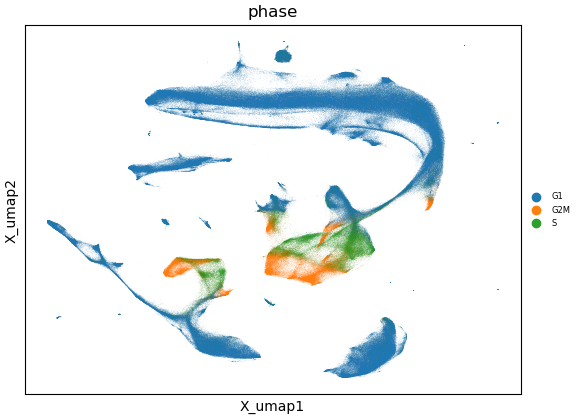

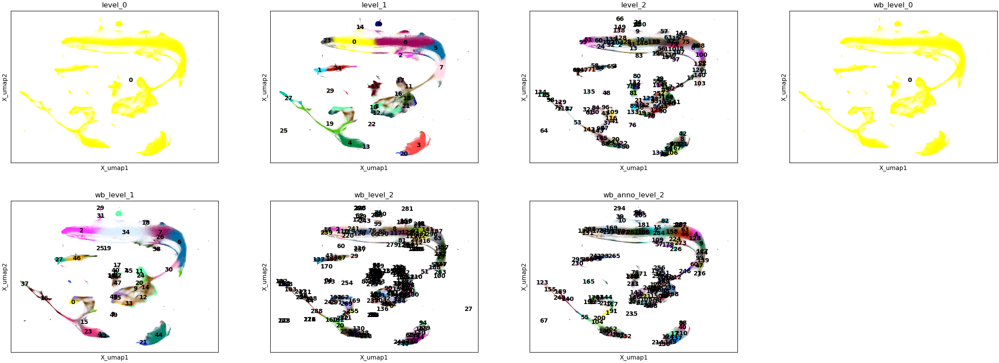

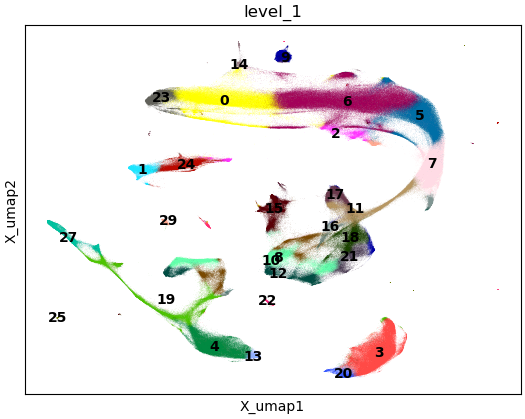

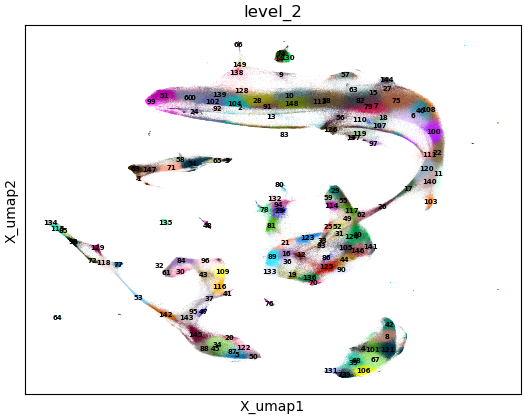


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x7fc4938731a0> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



Error in callback <function flush_figures at 0x7fbac20b9440> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



In [18]:
MDE_KEY='X_umap'

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["phase"],legend_fontsize=6,legend_fontweight='normal',save='_cc_phase.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_antipode_clusters.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='level_1',
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_level_1.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='level_2',
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    legend_loc='on data',save='_level_2.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'psi' in x],
    cmap='coolwarm',
    legend_loc='on data',save='_psi.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score'],cmap='coolwarm',save='_q_score.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['species'],save='_species.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['batch_name'],palette=sc.pl.palettes.godsnot_102,save='_batch_name.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['region'],save='_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['general_region'],save='_general_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['neighborhood'],save='_neighborhood.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['curated_class_label'],save='_curated_class_label.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['curated_class_label'],save='_curated_class_label_ondata.svg'
)



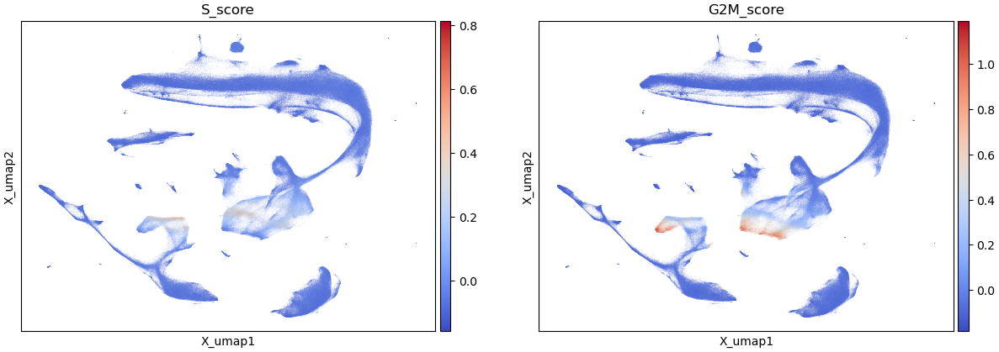

In [119]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['S_score','G2M_score'],
    cmap='coolwarm',
)


In [ ]:
MDE_KEY='X_antipode_MDE'

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["phase"],legend_fontsize=6,legend_fontweight='normal',save='_cc_phase.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_antipode_clusters.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='level_1',
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_level_1.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color='level_2',
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    legend_loc='on data',save='_level_2.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'psi' in x],
    cmap='coolwarm',
    legend_loc='on data',save='_psi.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score'],cmap='coolwarm',save='_q_score.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['species'],save='_species.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['batch_name'],palette=sc.pl.palettes.godsnot_102,save='_batch_name.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['region'],save='_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['general_region'],save='_general_region.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['neighborhood'],save='_neighborhood.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['curated_class_label'],save='_curated_class_label.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['curated_class_label'],save='_curated_class_label_ondata.svg'
)



In [32]:
aggr_means=antipode.model_functions.group_aggr_anndata(adata,['species','level_2'])
log_real_means=aggr_means[0] # #species,#cluster,#genes array

100%|██████████| 444/444 [01:07<00:00,  6.54it/s]


In [78]:
real_dev_mouse_means=pd.DataFrame(log_real_means[2],columns=adata.var.index,index=aggr_means[1]['level_2'])
real_dev_mouse_means=real_dev_mouse_means.loc[adata.uns['dendrogram_level_2']['categories_ordered'],:]

In [79]:
dev_cons_means=pd.DataFrame(cluster_params,columns=adata.var.index,index=cluster_labels)
dev_cons_means=dev_cons_means.loc[adata.uns['dendrogram_level_2']['categories_ordered'],:]

In [80]:
juvdata=sc.read_h5ad(os.path.expanduser('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/extra/KDCbVelocityMouseWbAdultPresupervisionHumanOrthos.h5ad'),backed=None)

In [81]:
#juvdata=juvdata.to_memory()

In [82]:
juv_aggr_means=antipode.model_functions.group_aggr_anndata(juvdata,['subclass_label'])
juv_log_real_means=juv_aggr_means[0]

100%|██████████| 327/327 [00:36<00:00,  8.86it/s] 


In [83]:
juv_mouse_means=pd.DataFrame(juv_log_real_means,columns=juvdata.var.index,index=juv_aggr_means[1]['subclass_label'])

In [84]:
juv_mouse_means=juv_mouse_means.loc[:,juv_mouse_means.columns.isin(dev_cons_means.columns)]
dev_cons_means=dev_cons_means.loc[:,dev_cons_means.columns.isin(juv_mouse_means.columns)]
juv_mouse_means=juv_mouse_means.loc[:,dev_cons_means.columns]
real_dev_mouse_means=real_dev_mouse_means.loc[:,real_dev_mouse_means.columns.isin(juv_mouse_means.columns)]

In [85]:
all_tf_genes=pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/gene_lists/TFs_lambert_pmid29425488_1.01.txt',sep='\t')

tf_genes=pd.read_csv('/home/matthew.schmitz/Matthew/utils/zizhens_tf_code.txt',sep='\t')
include_genes=tf_genes['gene'].str.upper()

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


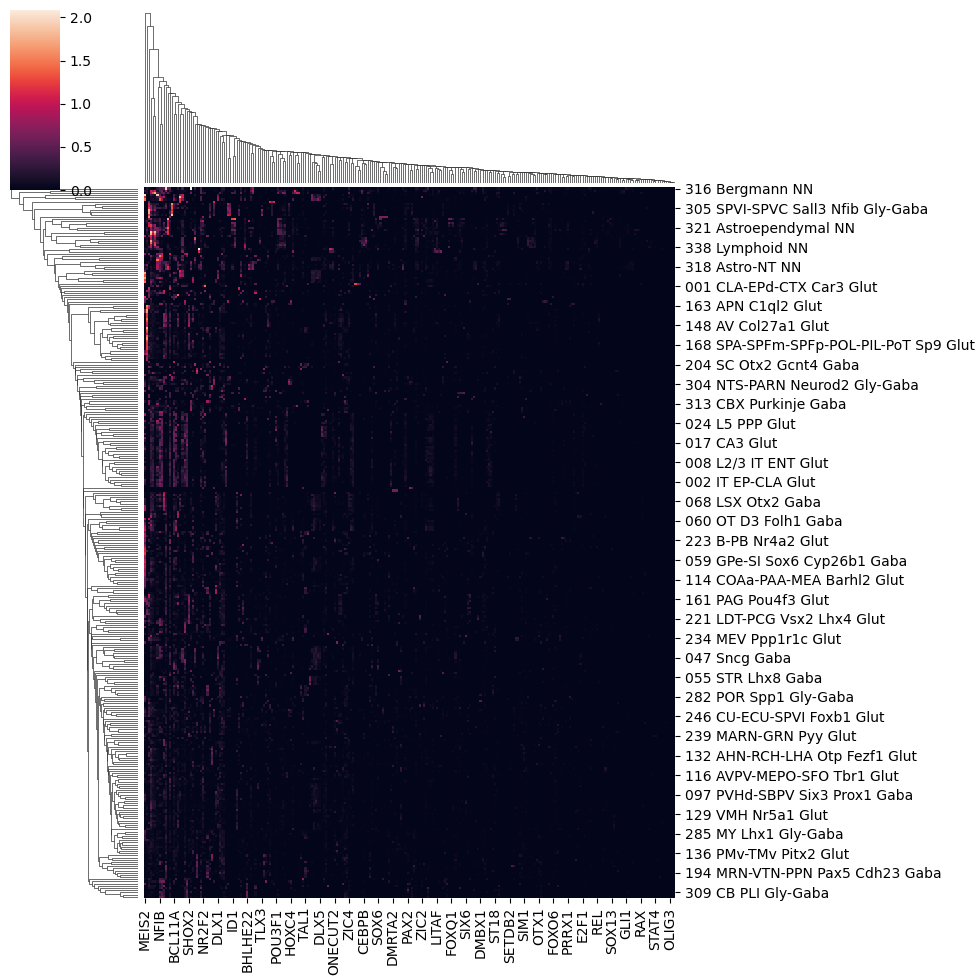

In [86]:
seaborn.clustermap(juv_mouse_means.loc[:,juv_mouse_means.columns.isin(include_genes)],col_cluster=True)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


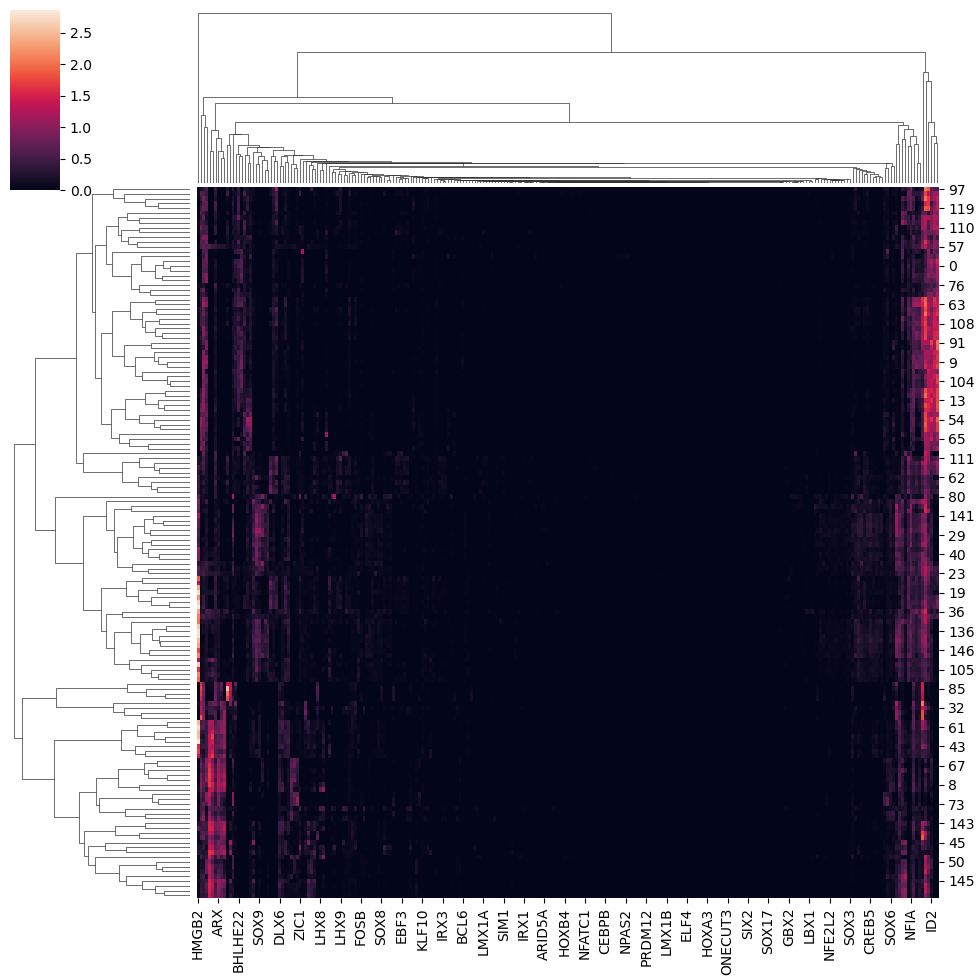

In [87]:
seaborn.clustermap(real_dev_mouse_means.loc[:,real_dev_mouse_means.columns.isin(include_genes)],col_cluster=True)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


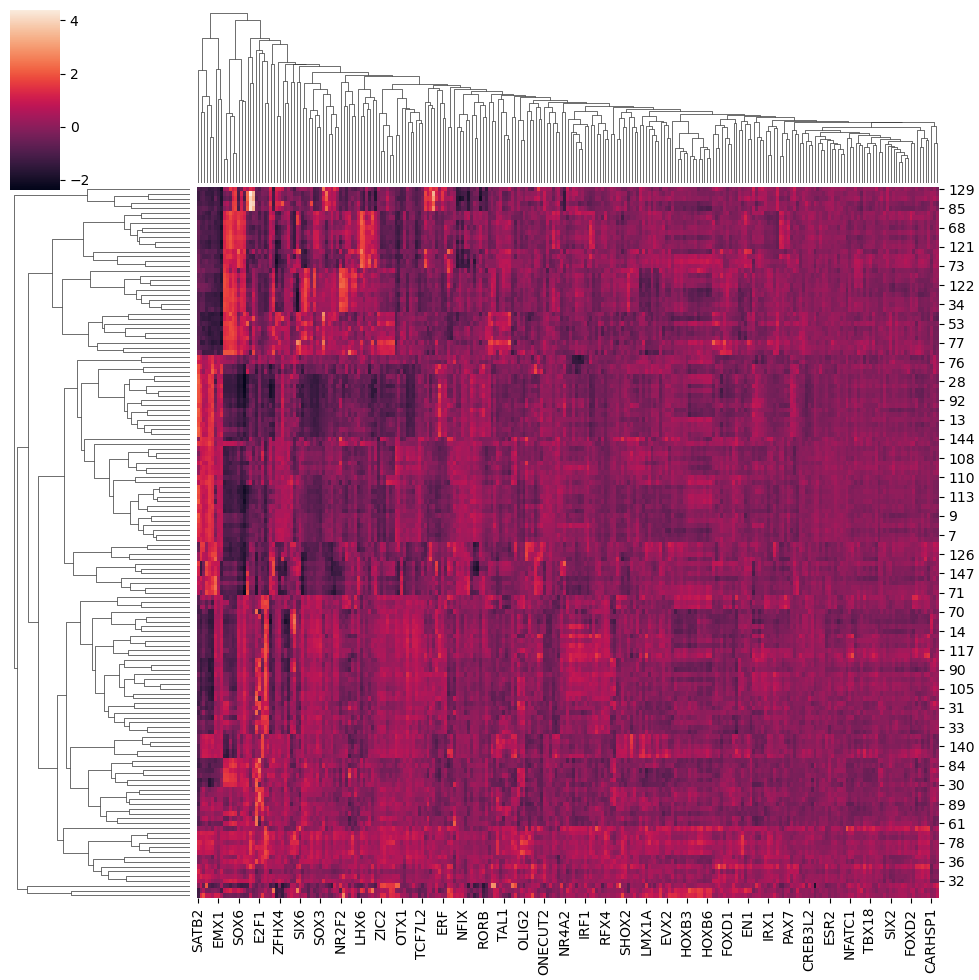

In [88]:
seaborn.clustermap(dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)]-dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)].mean(0),col_cluster=True)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


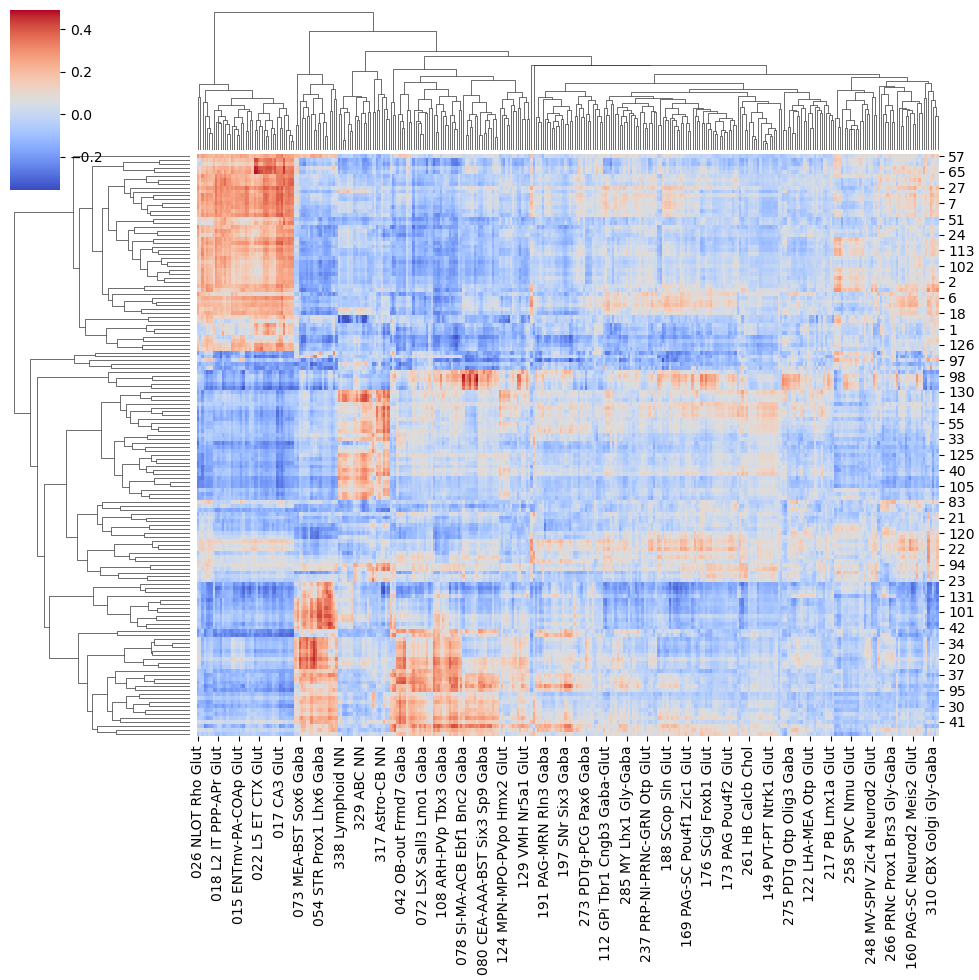

In [89]:
cons_corrs=sc_analysis.corr2_coeff(dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)]-dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)].mean(0),juv_mouse_means.loc[:,juv_mouse_means.columns.isin(include_genes)])
#thresh=2.
#corrs=sc_analysis.corr2_coeff((dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)]>thresh).astype(float),(abc_subclass_means.loc[:,abc_subclass_means.columns.isin(include_genes)]>thresh*2).astype(float))

cons_corrs=np.nan_to_num(cons_corrs,0.)
cons_corrs=pd.DataFrame(cons_corrs,index=dev_cons_means.index,columns=juv_mouse_means.index)
seaborn.clustermap(cons_corrs,cmap='coolwarm')

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


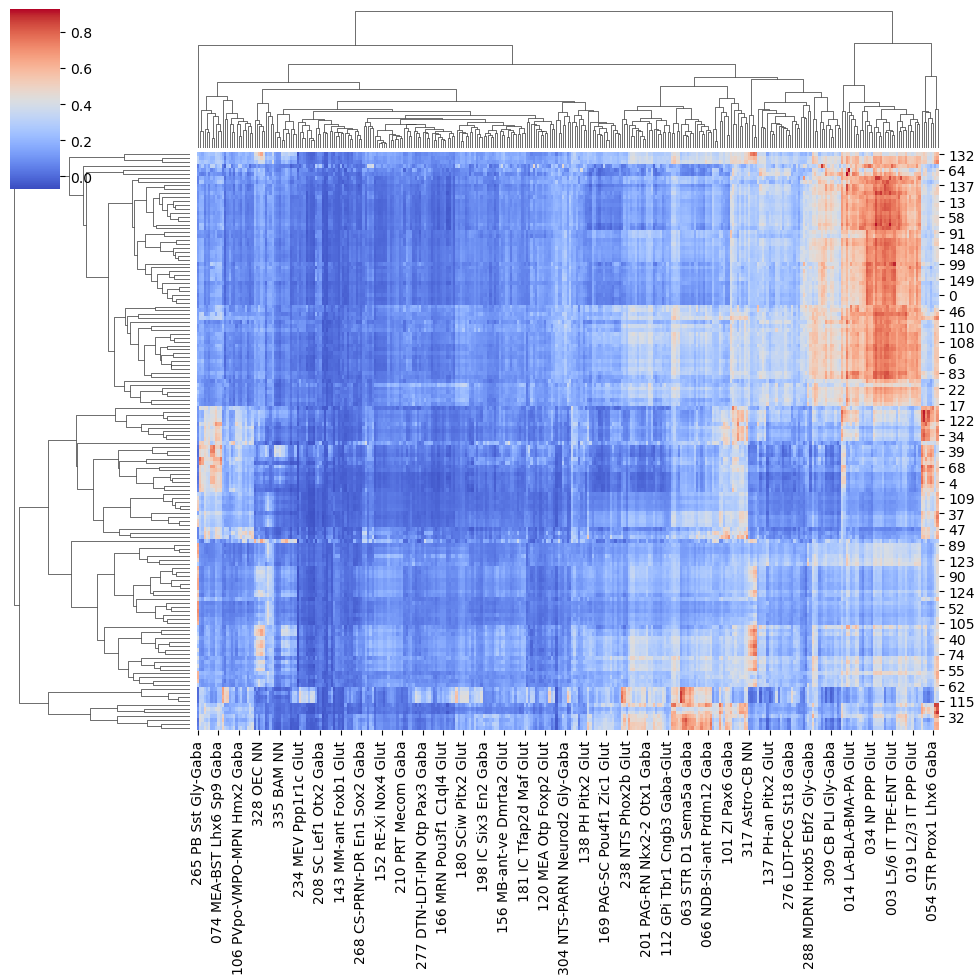

In [90]:
corrs=sc_analysis.corr2_coeff(real_dev_mouse_means.loc[:,real_dev_mouse_means.columns.isin(include_genes)],juv_mouse_means.loc[:,juv_mouse_means.columns.isin(include_genes)])
#thresh=2.
#corrs=sc_analysis.corr2_coeff((dev_cons_means.loc[:,dev_cons_means.columns.isin(include_genes)]>thresh).astype(float),(abc_subclass_means.loc[:,abc_subclass_means.columns.isin(include_genes)]>thresh*2).astype(float))

corrs=np.nan_to_num(corrs,0.)
corrs=pd.DataFrame(corrs,index=real_dev_mouse_means.index,columns=juv_mouse_means.index)
seaborn.clustermap(corrs,cmap='coolwarm')

In [91]:
marker_corr_dict=corrs.idxmax(1).to_dict()
cons_marker_corr_dict=cons_corrs.idxmax(1).to_dict()

In [92]:
adata.obs['juv_subclass_markercor']=adata.obs['level_2'].replace(marker_corr_dict)
adata.obs['cons_juv_subclass_markercor']=adata.obs['level_2'].replace(cons_marker_corr_dict)

/scratch/fast/17177540/ipykernel_230715/1234038333.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['juv_subclass_markercor']=adata.obs['level_2'].replace(marker_corr_dict)
/scratch/fast/17177540/ipykernel_230715/1234038333.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['cons_juv_subclass_markercor']=adata.obs['level_2'].replace(cons_marker_corr_dict)


/scratch/fast/17177540/ipykernel_230715/3985570983.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('cons_juv_subclass_markercor')['juv_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')


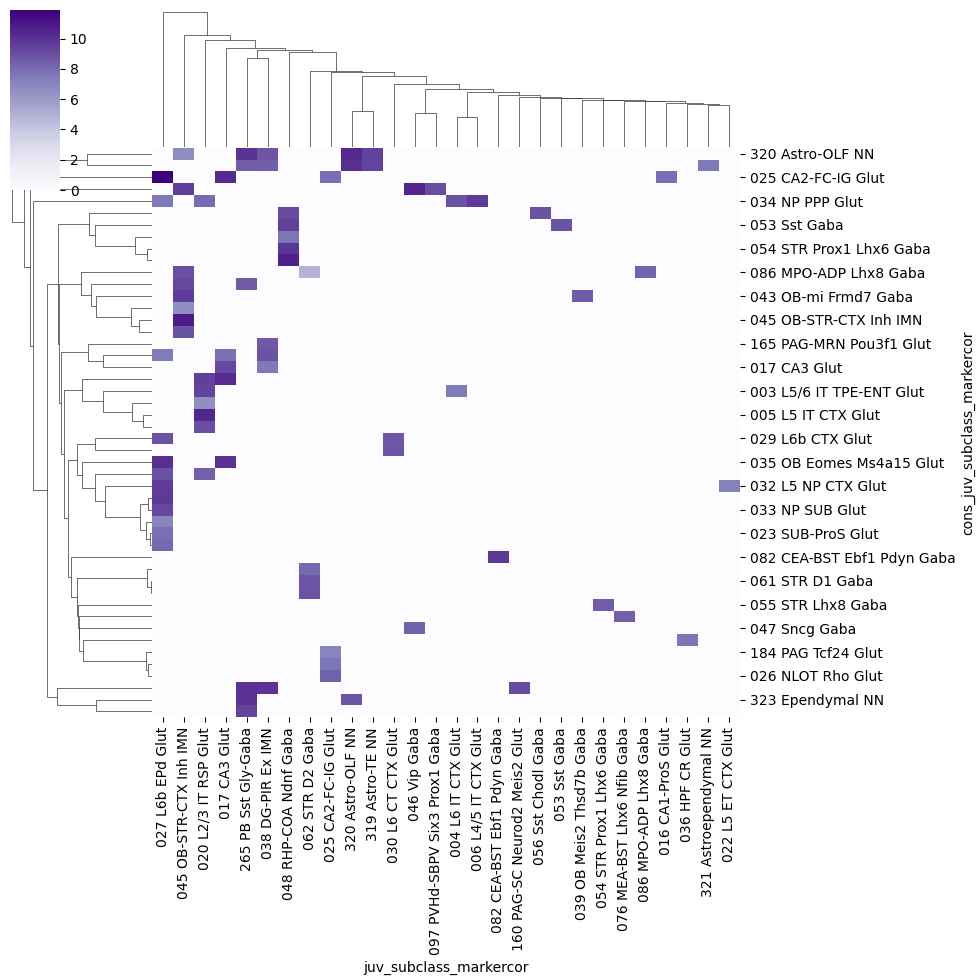

In [93]:
seaborn.clustermap(np.log(adata.obs.groupby('cons_juv_subclass_markercor')['juv_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')

/scratch/fast/17177540/ipykernel_230715/4244405948.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')


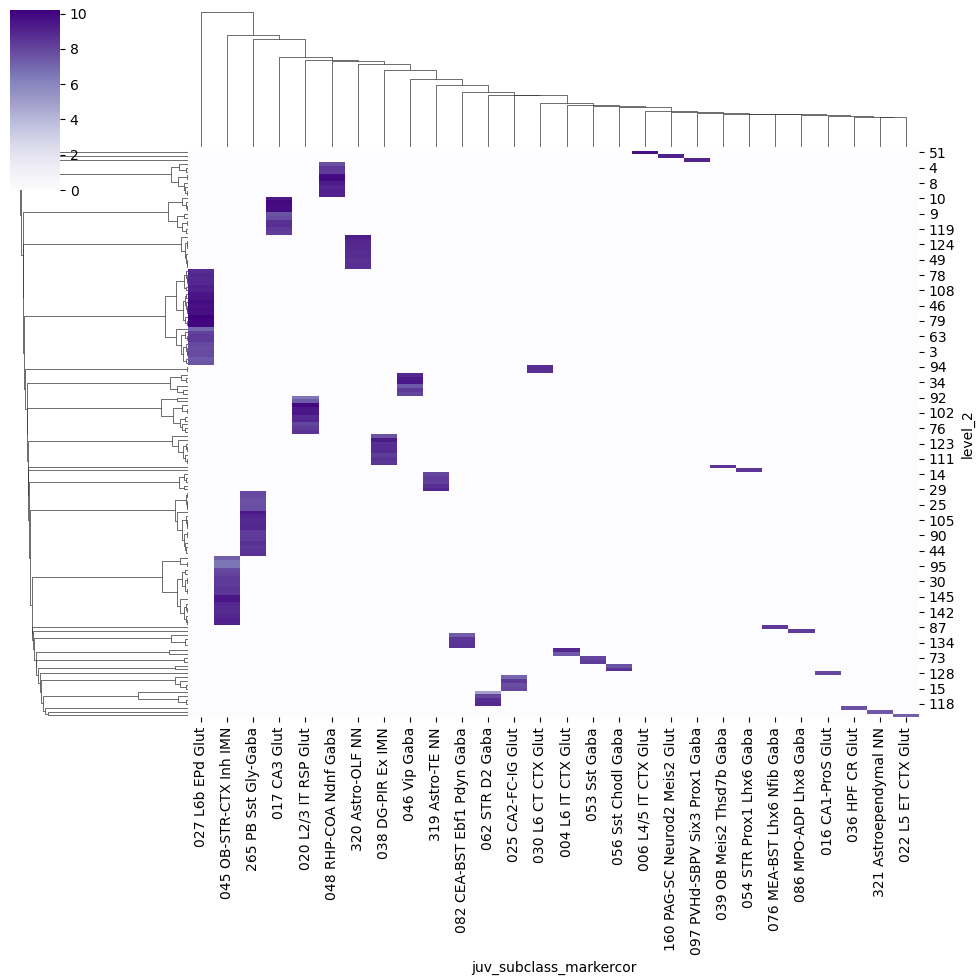

In [94]:
seaborn.clustermap(np.log(adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')

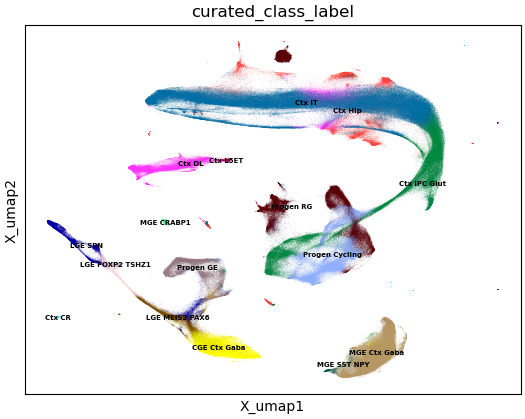

In [95]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    legend_loc='on data',palette=sc.pl.palettes.godsnot_102,legend_fontsize=5,
    color=['curated_class_label']
)


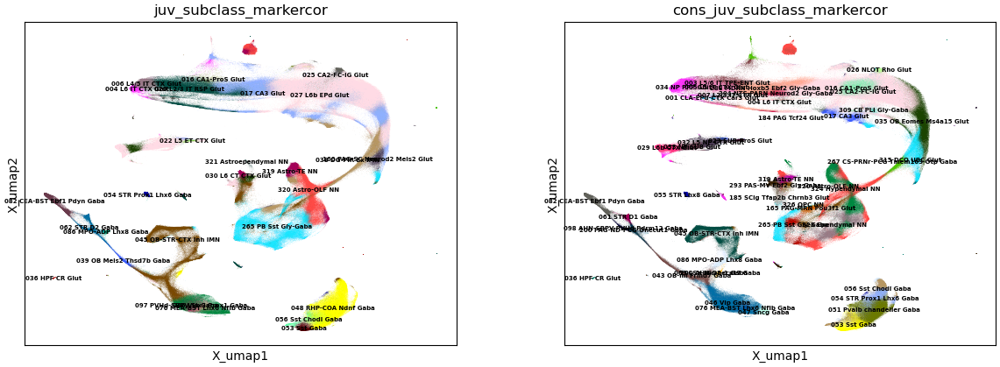

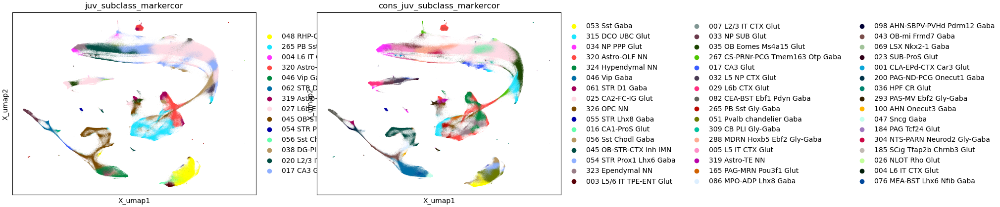

In [111]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["juv_subclass_markercor",'cons_juv_subclass_markercor'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',legend_fontsize=5
    
)
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["juv_subclass_markercor",'cons_juv_subclass_markercor'],
    palette=sc.pl.palettes.godsnot_102
)

In [97]:
dev_marker_df=antipode.post.get_quantile_markers(dev_cons_means,0.95)

100%|██████████| 148/148 [00:05<00:00, 26.19it/s]


In [98]:
juv_mouse_marker_df=antipode.post.get_quantile_markers(juv_mouse_means,0.95)

100%|██████████| 327/327 [00:30<00:00, 10.64it/s]


In [99]:
dev_marker_df=dev_marker_df.loc[:,dev_marker_df.columns.isin(juv_mouse_marker_df.columns)]

In [100]:
juv_mouse_marker_df=juv_mouse_marker_df.loc[:,dev_marker_df.columns]

In [101]:
top_5_maps = corrs.apply(antipode.post.get_n_largest(5), axis=1)
d=top_5_maps.to_dict()
top_5_maps_dict=dict(zip(d.keys(),[",".join(x) for x in d.values()]))

In [102]:
#Calculate the min value of each dev cluster and the mean of top 5 adult mappings in juvenile
shared_markers=[]
for k in marker_corr_dict.keys():
    shared_markers.append(np.min(np.stack([dev_marker_df.loc[k,:].to_numpy(),juv_mouse_marker_df.loc[top_5_maps[k],:].mean(0).to_numpy()],axis=1),axis=1))

In [103]:
marker_mins=pd.DataFrame(shared_markers,index=marker_corr_dict.keys(),columns=dev_marker_df.columns)

In [104]:
top_5_markers=marker_mins.apply(antipode.post.get_n_largest(5), axis=1)

In [105]:

#top_5_tfs=marker_mins.loc[:,marker_mins.columns.isin(include_genes)].apply(antipode.post.get_n_largest(5), axis=1)
top_5_tfs=marker_mins.loc[:,marker_mins.columns.isin(all_tf_genes['hgnc_symbol'])].apply(antipode.post.get_n_largest(5), axis=1)

In [106]:
top_5_markers_list=list(top_5_markers)
top_5_tfs_list=list(top_5_tfs)

In [107]:
top_5_markers

9        [BSN, CAMTA2, SMPD3, SLC8A2, TMEM121B]
138        [NELL2, GRIN2B, LPL, ATP2B1, LINGO1]
149         [NELL2, ATP2B1, OLFM1, LPL, LINGO1]
66     [ATP2B1, CELF5, RASGEF1A, GRIN2B, CAMKV]
83        [PCDH1, TMEM121B, CPE, LRRN2, CAMTA2]
                         ...                   
136       [HMGB2, CLDN10, VANGL1, ASRGL1, SMC4]
133           [HMGB2, CENPT, SMC4, UBE2C, DKC1]
61          [HMGB2, HMGB3, TSHZ1, KAT6B, CENPT]
48          [CPLX3, FTH1, NSMF, SELENOW, TMOD3]
76            [CPLX3, CHN1, BRK1, FTH1, TMEM40]
Length: 148, dtype: object

In [108]:
top_5_tfs

9      [CAMTA2, ZBTB18, FOXG1, HIVEP2, USF3]
138      [ZBTB18, SATB2, ATF6, ZGLP1, GLIS3]
149          [ATF6, RUNX2, CRX, DBX1, NR1I2]
66       [OSR1, RUNX2, AHRR, TBPL2, CREB3L3]
83      [CAMTA2, USF3, HESX1, NR1I2, PRDM13]
                       ...                  
136       [CENPT, CENPA, MXD3, FOXM1, GATA1]
133       [CENPT, CENPA, MXD3, FOXM1, FOXN4]
61        [TSHZ1, CENPT, ZNF207, MXD3, SIX2]
48        [EMX1, ETV2, FOXP3, ZNF488, ASCL2]
76          [DLX3, TLX2, ZNF784, SIX1, ETV2]
Length: 148, dtype: object

In [64]:
adata.uns['dendrogram_level_2']['groupby']=['level_2']

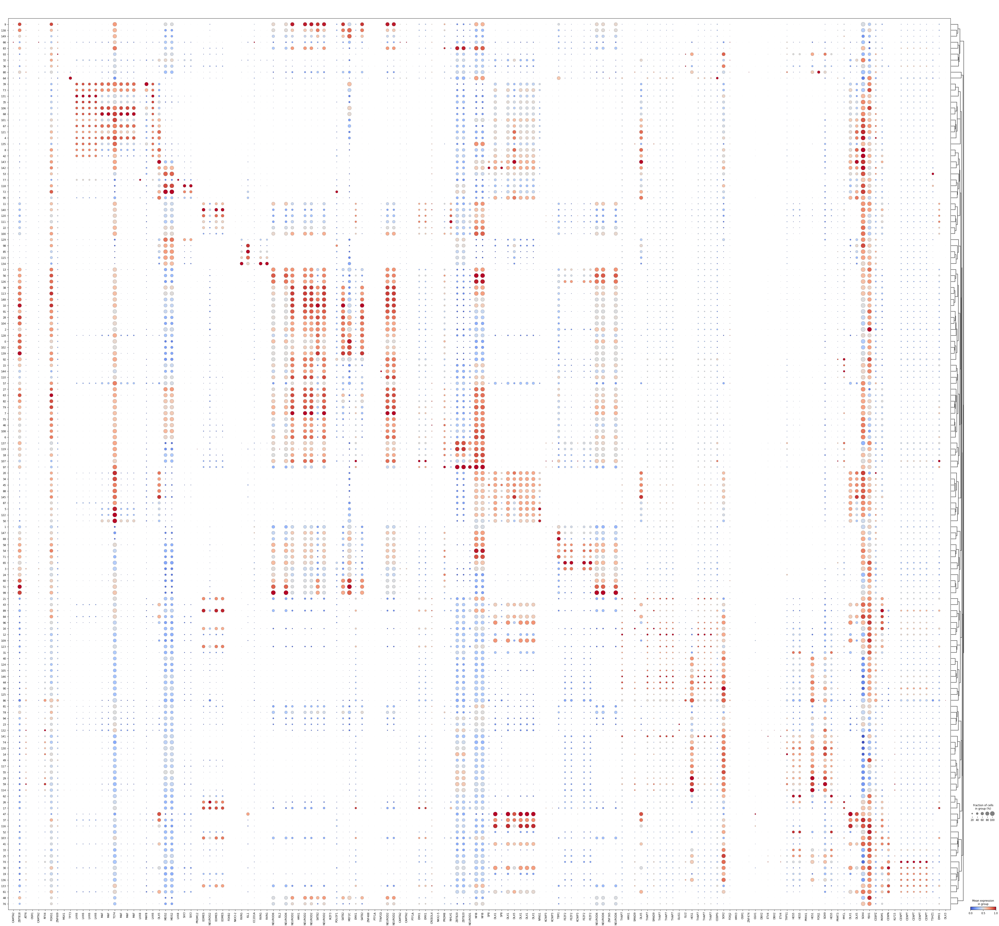

In [109]:
gene_order=np.array([x[0] for x in top_5_tfs])
gene_order=gene_order#[adata.uns['dendrogram_level_2']['categories_idx_ordered']]
sc.pl.dotplot(adata,groupby='level_2',var_names=gene_order,dendrogram='dendrogram_level_2',standard_scale='var',use_raw=False,cmap='coolwarm')

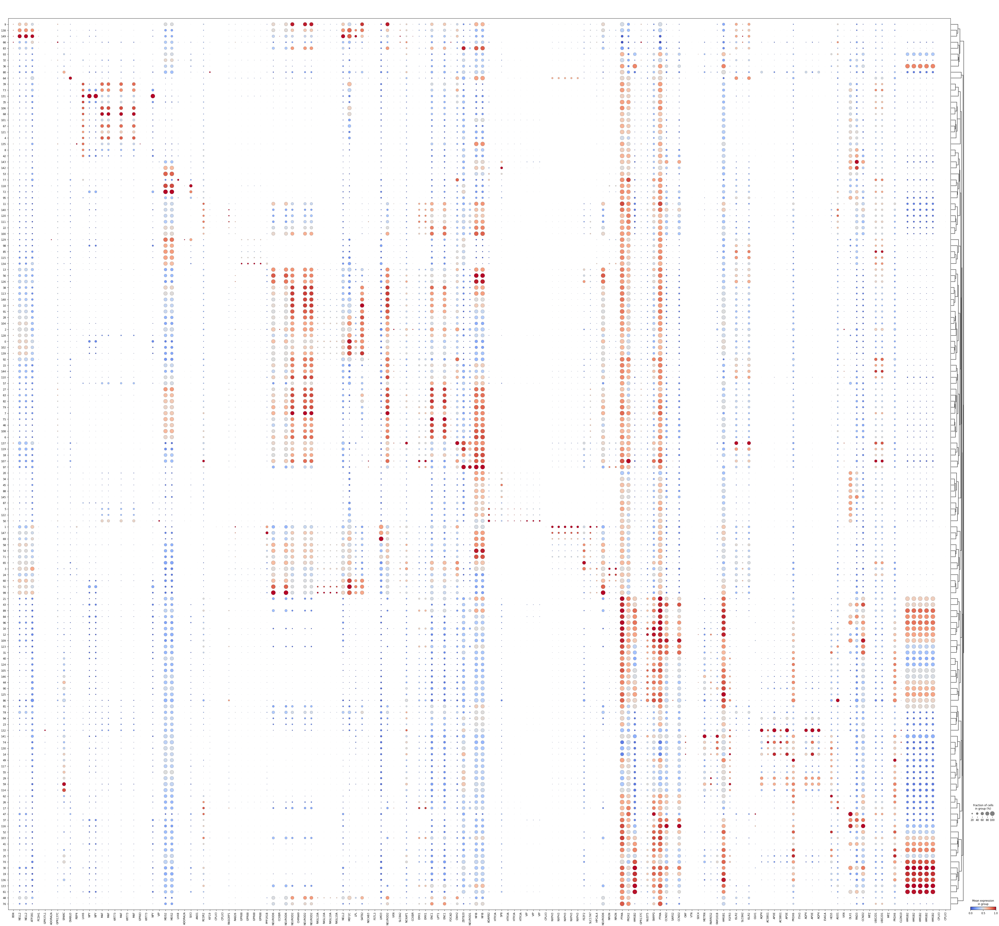

In [110]:
gene_order=np.array([x[0] for x in top_5_markers])
gene_order=gene_order#[adata.uns['dendrogram_level_2']['categories_idx_ordered']]
sc.pl.dotplot(adata,groupby='level_2',var_names=gene_order,dendrogram='dendrogram_level_2',standard_scale='var',use_raw=False,cmap='coolwarm')

In [67]:
marker1=[]
for i in range(len(top_5_tfs_list)):
    marker1.append(top_5_tfs_list[i][0])

marker2=[]
for i in range(len(top_5_markers_list)):
    this_set=[x for x in top_5_markers_list[i] if x !=marker1[i]]
    marker2.append(list(this_set)[0])

marker_df=pd.DataFrame([marker1,marker2],index=['marker1','marker2'],columns=top_5_markers.index).T

In [68]:
marker_df.index=marker_df.index.to_series()+"_"+marker_df.index.to_series().replace(adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts().unstack().idxmax(1).to_dict())

/scratch/fast/17177540/ipykernel_230715/315822407.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  marker_df.index=marker_df.index.to_series()+"_"+marker_df.index.to_series().replace(adata.obs.groupby('level_2')['juv_subclass_markercor'].value_counts().unstack().idxmax(1).to_dict())


In [69]:
for i in marker_df.index:
    print(i,marker_df.loc[i,'marker1'],marker_df.loc[i,'marker2'])

106_048 RHP-COA Ndnf Gaba MAF CORT
89_265 PB Sst Gly-Gaba SMAD9 HMGB2
99_004 L6 IT CTX Glut NEUROD6 NRGN
25_265 PB Sst Gly-Gaba KLF15 PRDX6
40_320 Astro-OLF NN GLI2 OAF
5_046 Vip Gaba DLX1 VIP
129_062 STR D2 Gaba RXRG GPR88
132_319 Astro-TE NN DBX2 AQP4
38_027 L6b EPd Glut NEUROD2 FGF5
23_045 OB-STR-CTX Inh IMN GSX1 FGA
135_054 STR Prox1 Lhx6 Gaba LHX8 GPR83
31_045 OB-STR-CTX Inh IMN OLIG1 CCND2
82_027 L6b EPd Glut PTF1A CCKBR
131_056 Sst Chodl Gaba LHX6 NPY
61_045 OB-STR-CTX Inh IMN TSHZ1 HMGB2
27_027 L6b EPd Glut CAMTA2 SLC8A2
57_027 L6b EPd Glut NEUROD2 VXN
26_038 DG-PIR Ex IMN PRMT3 AGO1
74_320 Astro-OLF NN DBX2 APOE
101_048 RHP-COA Ndnf Gaba TCF4 KRT73
86_265 PB Sst Gly-Gaba FOXJ2 FGFR3
105_265 PB Sst Gly-Gaba THAP7 SDC4
138_004 L6 IT CTX Glut ZBTB18 NELL2
93_045 OB-STR-CTX Inh IMN RFX4 GPR37L1
92_020 L2/3 IT RSP Glut ZNF488 NECAB3
148_017 CA3 Glut NEUROD2 PRSS12
35_056 Sst Chodl Gaba LHX6 NPY
71_027 L6b EPd Glut KCNIP3 NXPH3
30_045 OB-STR-CTX Inh IMN CENPT HMGB2
51_006 L4/5 IT CT

In [70]:
region_tab=adata.obs.groupby('level_2')['general_region'].value_counts().unstack()

/scratch/fast/17177540/ipykernel_230715/3283632780.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  region_tab=adata.obs.groupby('level_2')['general_region'].value_counts().unstack()


In [71]:
region_tab=region_tab/region_tab.sum(0)
region_tab=(region_tab.T/region_tab.sum(1)).T

In [72]:
region_tab

general_region,bn,cp,ctx,de,ge,h,hb,mb
level_2,,,,,,,,
106,0.095444,0.204354,0.334491,0.040642,0.105546,0.206498,0.004556,0.008468
89,0.041761,0.026036,0.072367,0.183478,0.004471,0.059797,0.529813,0.082278
99,0.007131,0.751672,0.147964,0.010310,0.002589,0.060138,0.001380,0.018816
25,0.301337,0.000000,0.353431,0.000000,0.294687,0.000000,0.010715,0.039829
40,0.214242,0.000000,0.475332,0.013005,0.224639,0.012636,0.014247,0.045899
...,...,...,...,...,...,...,...,...
87,0.036119,0.037030,0.122484,0.281194,0.163586,0.137645,0.137967,0.083975
84,0.240448,0.003694,0.017932,0.142968,0.481965,0.100884,0.011287,0.000823
20,0.173857,0.007022,0.220999,0.171765,0.158573,0.222568,0.020194,0.025022


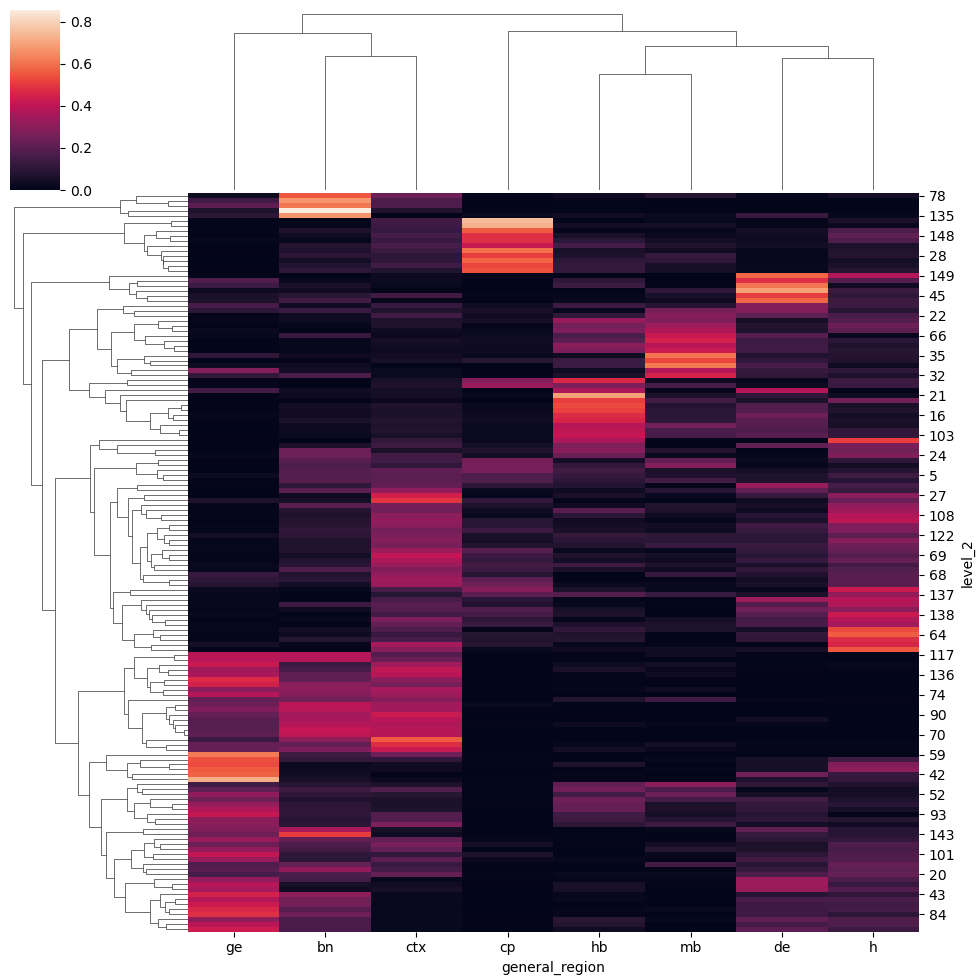

In [114]:
seaborn.clustermap(region_tab)

In [74]:
region_tab

general_region,bn,cp,ctx,de,ge,h,hb,mb
level_2,,,,,,,,
106,0.095444,0.204354,0.334491,0.040642,0.105546,0.206498,0.004556,0.008468
89,0.041761,0.026036,0.072367,0.183478,0.004471,0.059797,0.529813,0.082278
99,0.007131,0.751672,0.147964,0.010310,0.002589,0.060138,0.001380,0.018816
25,0.301337,0.000000,0.353431,0.000000,0.294687,0.000000,0.010715,0.039829
40,0.214242,0.000000,0.475332,0.013005,0.224639,0.012636,0.014247,0.045899
...,...,...,...,...,...,...,...,...
87,0.036119,0.037030,0.122484,0.281194,0.163586,0.137645,0.137967,0.083975
84,0.240448,0.003694,0.017932,0.142968,0.481965,0.100884,0.011287,0.000823
20,0.173857,0.007022,0.220999,0.171765,0.158573,0.222568,0.020194,0.025022


In [117]:
marker_df

,marker1,marker2
106_048 RHP-COA Ndnf Gaba,MAF,CORT
89_265 PB Sst Gly-Gaba,SMAD9,HMGB2
99_004 L6 IT CTX Glut,NEUROD6,NRGN
25_265 PB Sst Gly-Gaba,KLF15,PRDX6
40_320 Astro-OLF NN,GLI2,OAF
...,...,...
87_076 MEA-BST Lhx6 Nfib Gaba,DLX1,HTR3A
84_045 OB-STR-CTX Inh IMN,DLX5,GPR137C
20_046 Vip Gaba,SP8,ADARB2
143_045 OB-STR-CTX Inh IMN,DLX5,VIP


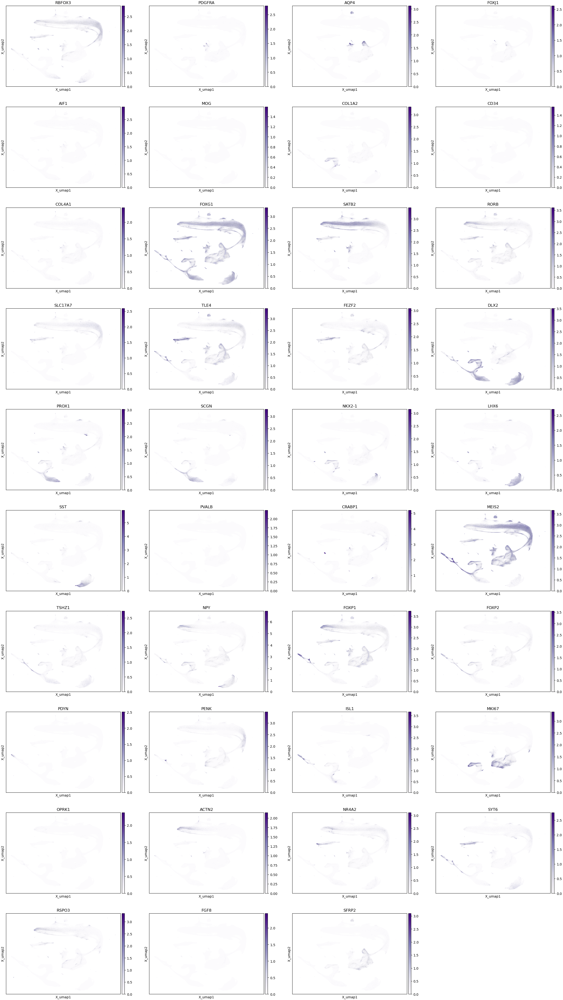

In [76]:
gene_list=['RBFOX3','PDGFRA','AQP4','FOXJ1','AIF1','MOG','COL1A2','CD34','COL4A1','FOXG1','SATB2','RORB','SLC17A7','TLE4','FEZF2',
           'DLX2','PROX1','SCGN','NKX2-1','LHX6','SST','PVALB','CRABP1','MEIS2','TSHZ1','NPY','FOXP1','FOXP2','PDYN','PENK','ISL1',
           'MKI67','OPRK1','ACTN2','NR4A2','SYT6','RSPO3','FGF8','SFRP2']
gene_list=[x for x in gene_list if x in adata.var.index]
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=gene_list,cmap='Purples',
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=6,
    legend_loc='on data',use_raw=False
)


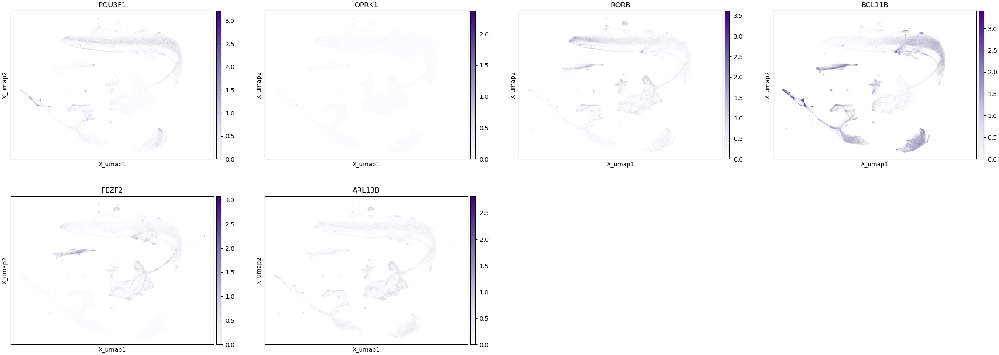

In [115]:
#L5ET
gene_list=['POU3F1','OPRK1','RORB','BCL11B','FEZF2','ARL13B']
gene_list=[x for x in gene_list if x in adata.var.index]
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=gene_list,cmap='Purples',
    palette=sc.pl.palettes.godsnot_102,legend_fontsize=6,
    legend_loc='on data',use_raw=False
)


In [ ]:
seaborn.histplot(adata.obs['q_score'])

In [ ]:
adata.obs['level_2']=adata.obs['level_2'].astype(str)
adata.obs['juv_subclass_markercor']=adata.obs['juv_subclass_markercor'].astype(str)
adata.obs['curated_class_label']=adata.obs['curated_class_label'].astype(str)


In [ ]:
mini_adata=sc_analysis.select_k_cells(adata,'level_2',100000).to_memory()

In [ ]:
mini_adata.obs=mini_adata.obs.drop(['clean_cellname', 'full_cellname', 'msregion'],axis=1)

In [ ]:
mini_adata.write_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/hct_ux3_cellxgene/anndata_080/V1Evo/mini_tel_adata.h5ad')

In [ ]:
import importlib
antipode.post=importlib.reload(antipode.post)

In [ ]:
aggr_means=antipode.model_functions.group_aggr_anndata(adata,['species','level_2'])
log_real_means=aggr_means[0] # #species,#cluster,#genes array

In [ ]:
import matplotlib.font_manager
print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))
matplotlib.font_manager.font_family_aliases

In [ ]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif']='DejaVuSansMono'
plt.rcParams['pdf.fonttype']=42


In [ ]:
dc_df=pd.DataFrame(pstore['discov_dc'].var(2).T,index=latent_labels,columns=discov_labels)
# dm_df=pd.DataFrame(pstore['discov_dm'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
# dmt_df=pd.DataFrame((pstore['discov_dm'][:,cluster_index,:].var(1)).T,index=latent_labels,columns=discov_labels)
# di_df=pd.DataFrame(pstore['discov_di'][:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
prop_di=np.einsum('lc,scg->slg',prop_taxon,pstore['discov_di'])
prop_dm=np.einsum('lc,scg->slg',prop_taxon,pstore['discov_dm'])
dm_df=pd.DataFrame(prop_dm[:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)
dmt_df=pd.DataFrame((prop_dm[:,cluster_index,:].var(1)).T,index=latent_labels,columns=discov_labels)
di_df=pd.DataFrame(prop_di[:,cluster_index,:].var(2).T,index=cluster_labels,columns=discov_labels)



In [ ]:
#cluster_anno_df=pd.DataFrame([pstore['edges_1'].argmax(-1)[cluster_index].astype(str)]).T
cluster_anno_df=pd.DataFrame(adata.obs.groupby('level_2')['level_1'].value_counts(dropna=True).unstack().idxmax(1))
cluster_anno_df.columns=['level_1']
#cluster_anno_df=cluster_anno_df.loc[cluster_label_order,:]
#cluster_anno_df.index=[str(x) for x in range(cluster_anno_df.shape[0])]
#cluster_anno_df['cell_class']=adata.obs.groupby('level_2')['cell_class'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['level_2']=adata.obs['level_2'].cat.categories
cluster_anno_df['q_score']=adata.obs.groupby('level_2')['q_score'].mean()
adata.obs['log_n_genes']=np.log10(adata.obs['n_genes'])
cluster_anno_df['log_n_genes']=adata.obs.groupby('level_2')['log_n_genes'].mean()
cluster_anno_df['phase']=adata.obs.groupby('level_2')['phase'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['curated_class_label']=adata.obs.groupby('level_2')['curated_class_label'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['neighborhood']=adata.obs.groupby('level_2')['neighborhood'].value_counts(dropna=True).unstack().idxmax(1)
cluster_anno_df['neighborhood']=cluster_anno_df['neighborhood'].astype('category')
cluster_anno_df['curated_class_label']=cluster_anno_df['curated_class_label'].astype('category')
cluster_anno_df['neighborhood']=cluster_anno_df['neighborhood'].cat.reorder_categories(sorted(cluster_anno_df['neighborhood'].cat.categories))
cluster_anno_df['curated_class_label']=cluster_anno_df['curated_class_label'].cat.reorder_categories(sorted(cluster_anno_df['curated_class_label'].cat.categories))
cluster_anno_df.index=list(cluster_anno_df['level_2'])

left_ha = pch.HeatmapAnnotation(
            #level_2=pch.anno_simple(cluster_anno_df['level_2'], rasterized=False,cmap='godsnot_102',legend=False),
            neighborhood=pch.anno_simple(cluster_anno_df.neighborhood, rasterized=False,legend=True,cmap='godsnot_102'),
            curated_class_label=pch.anno_simple(cluster_anno_df.curated_class_label, rasterized=False,legend=False,cmap='godsnot_102'),
            level_1=pch.anno_simple(cluster_anno_df.level_1, rasterized=False,legend=False,cmap='godsnot_102'),
            phase=pch.anno_simple(cluster_anno_df['phase'], rasterized=False,cmap='bog',legend=True),
            q_score=pch.anno_simple(cluster_anno_df.q_score, rasterized=False,legend=False,cmap='coolwarm'),
            log_n_genes=pch.anno_simple(cluster_anno_df.log_n_genes, rasterized=False,legend=False,cmap='coolwarm'),
            axis=0)

In [ ]:
cell_cutoff=50
species_binary=adata.obs.groupby('level_2')['species'].value_counts(normalize=False).unstack()>cell_cutoff
zdw_mat=pd.DataFrame(np.absolute(pstore['z_decoder_weight']),index=latent_labels,columns=var_labels).T
species_mat=adata.obs.groupby('level_2')['species'].value_counts(normalize=False).unstack()
species_mat=(species_mat/species_mat.sum(0))
region_mat=adata.obs.groupby('level_2')['general_region'].value_counts(normalize=True).unstack()
#region_mat=(region_mat/region_mat.sum(0))
region_mat=region_mat.loc[:,['ctx','ge','bn','de','mb','hb','cp','h']]

species_ha_dict={}
for col in region_mat.columns:
    species_ha_dict[col]=pch.anno_simple(region_mat[col],cmap='Greens',legend=False)

for col in species_mat.columns:
    species_ha_dict[col]=pch.anno_simple(species_mat[col],cmap='Blues',legend=False)

for col in species_binary.columns:
    species_ha_dict[col+'>'+str(cell_cutoff)]=pch.anno_simple(species_binary[col],cmap='Grays',legend=False)

for col in dm_df.columns:
    species_ha_dict[col+'_DM']=pch.anno_simple(dm_df[col],cmap='Purples',legend=False)

for col in di_df.columns:
    species_ha_dict[col+'_DI']=pch.anno_simple(di_df[col],cmap='Reds',legend=False)

species_ha_dict['label']=pch.anno_label(cluster_anno_df['level_2'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-6.,0.],fontsize=2,arrowprops = dict(visible=False))

right_ha = pch.HeatmapAnnotation(**species_ha_dict,axis=0)


In [ ]:
div_markers={'G0':list(set([])),#'YWHAG','NNAT'
             'G1':list(set(['CCND1','CCND2','CCND3','CCNE1','CCNE2','MKI67','PCNA'])),
'G1S':list(set(['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7',
      'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'RAD51AP1', 'GMNN', 
      'WDR76', 'SLBP', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 
      'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 
      'E2F8','H4C3','H1-3','H1-5','H2AC12','H2AC20','H1-2','H1-4','H1-1','FBXO5',
      'SPC25','FAM83D','HIST1H1A','HIST1H1B','HIST1H1C','HIST1H1D','HIST1H1E','CCND1','CCND2','CCND3'])),#,'CCNE1', 'CCNE2'
'G2M':list(set(['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 
       'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 
       'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 
       'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 
       'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 
       'GAS2L3', 'CBX5','ASPM','CENPA','CCND1','CCND2','CCND3']))
        }

gl_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/'
vg_genes=pd.read_csv(os.path.join(gl_path,'HGNC_voltage_gated.tsv'),sep='\t')
np_genes=pd.read_csv(os.path.join(gl_path,'MTS_neuropeptides_receptors.tsv'),sep='\t')
np_genes['type'] = np_genes['type'].str.split(',')
np_genes = np_genes.explode('type')
autism_genes=pd.read_csv(os.path.join(gl_path,'SFARI_autism.tsv'),sep='\t')
tf_genes=pd.read_csv(os.path.join(gl_path,'TFs_lambert_pmid29425488_1.01.txt'),sep='\t')

short_gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>2,'gene-symbol']
}

bp_dict=gseapy.get_library('GO_Biological_Process_2023')
bp_keys=list(bp_dict.keys())

chosen_bp=['Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
'Mitochondrion Distribution (GO:0048311)',
 ]
bp=chosen_bp

for x in bp:
    term=x.split(' (GO:')[0]
    short_gene_lists[term]=bp_dict[x]

for k in short_gene_lists.keys():
    if adata.var.index.isin(short_gene_lists[k]).sum()<5:
        del gene_lists[k]


gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    #'Voltage-gated':vg_genes['Approved symbol'],
    #'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>1,'gene-symbol'],
}


for k in gene_lists.keys():
    if adata.var.index.isin(gene_lists[k]).sum()<5:
        del gene_lists[k]




In [ ]:
prerank_out=antipode.plotting.get_prerank_from_mat(zdw_mat,short_gene_lists,min_size=3,max_size=max([len(short_gene_lists[k]) for k in short_gene_lists.keys()])+100,permutation_num=1000)
prerank_out_df=prerank_out.pivot_table( index='input_column',columns='Term', values='NES', aggfunc='first').astype(float)
prerank_out_pval_df=prerank_out.pivot_table( index='input_column',columns='Term', values='FDR q-val', aggfunc='first').astype(float)

In [ ]:
term_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df.T,method='average',metric='correlation')
term_linkage_order_inds=scipy.cluster.hierarchy.leaves_list(term_linkage)
term_linkage_order=pd.Series(prerank_out_df.columns)[scipy.cluster.hierarchy.leaves_list(term_linkage)].to_list()

col_linkage=scipy.cluster.hierarchy.linkage(loc_df.T.abs(),method='average',metric='correlation')
latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
latent_label_order=pd.Series(latent_labels)[latent_label_order_inds].to_list()

# col_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df,method='average',metric='correlation')
# latent_label_order_inds=scipy.cluster.hierarchy.leaves_list(col_linkage)
# latent_label_order=pd.Series(prerank_out_df.index)[latent_label_order_inds].to_list()

In [ ]:
prerank_out_df

In [ ]:
seaborn.clustermap(prerank_out_df.T,col_cluster=True,row_cluster=True,metric='correlation',yticklabels=True,cmap='coolwarm')

In [ ]:
latent_ha_dict={}
breaks=pd.DataFrame({'breaks':[str(int(np.floor(i/20))) for i in range(len(latent_label_order))]},index=latent_label_order)

column_df=dc_df.copy()
column_df.loc[:,prerank_out_df.columns]=prerank_out_df
column_df.loc[:,breaks.columns]=breaks
column_df['index']=column_df.index
column_df=column_df.loc[latent_label_order,:]

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(column_df[col],cmap='Greens',legend=False,rasterized=True)

for col in dmt_df.columns:
    latent_ha_dict[col+'_DM']=pch.anno_simple(dmt_df[col],cmap='Purples',legend=False,rasterized=True)

for k in term_linkage_order:#gl_preranks.keys():
    latent_ha_dict[k]=pch.anno_simple(column_df[k],cmap='coolwarm',legend=False,alpha=(1-prerank_out_pval_df.loc[column_df.index,k]))#vmin=prerank_out_df[k].min(),vmax=column_df[k].max(),

#latent_ha_dict['breaks']=pch.anno_simple(column_df['breaks'])

mat_anno_df=pd.DataFrame(np.log10(1.+np.absolute(pstore['z_decoder_weight']).sum(1)),columns=['logabsweightsum'],index=latent_labels)
column_df['logabsweightsum']=mat_anno_df
latent_ha_dict['logabsweightsum']=pch.anno_barplot(mat_anno_df['logabsweightsum'], cmap='Greys',rasterized=True,legend=False)
bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)


top_anno_dict={}
top_anno_dict['label']=pch.anno_label(column_df['index'], merge=True, rotation=0,adjust_color=False,colors='black',extend=True,relpos=[-1.,-5.],fontsize=5,arrowprops = dict(visible=False))
top_anno = pch.HeatmapAnnotation(**top_anno_dict,axis=1,orientation='up',plot=False)


plt.figure(figsize=(10,8))
#.loc[:,latent_label_order]
#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage}, col_split_order="cluster_between_groups",col_split=breaks['breaks']
#row_cluster=False,row_dendrogram=True,row_dendrogram_kws={'linkage':row_linkage},
#cm1 = pch.ClusterMapPlotter(data=loc_df,cmap='coolwarm',row_cluster=True,row_dendrogram=True,row_dendrogram_kws={'linkage':row_linkage},left_annotation=left_ha,top_annotation=top_anno,right_annotation=right_ha,bottom_annotation=bottom_ha,col_cluster=True,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage},rasterized=True)#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage})
scaleddf=((loc_df-loc_df.mean(0))/(np.quantile(loc_df.std(0),0.25)+loc_df.std(0)))
max_val=np.max(np.absolute(scaleddf.min(),scaleddf.max()))*0.5 #clip to 0.5 of max to make more visible
cm1 = pch.ClusterMapPlotter(data=scaleddf,cmap='coolwarm',row_cluster=True,row_dendrogram=True,left_annotation=left_ha,top_annotation=top_anno,right_annotation=right_ha,bottom_annotation=bottom_ha,col_cluster=True,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage},rasterized=True,vmin=-max_val,vmax=max_val)#,col_dendrogram=True,col_dendrogram_kws={'linkage':col_linkage})
plt.savefig(os.path.join(sc.settings.figdir,'Fig2Clustermap.svg'))
plt.show()

In [ ]:
#adata.obs['level_2']=adata.obs['level_2'].astype('string')

In [ ]:
#adata.write_h5ad(os.path.join(model_path,'analysis_inprogress.h5ad'))

In [ ]:
adata.to_memory().X.max()

In [ ]:
print(gseapy.get_library_name())

In [ ]:
print(gseapy.get_library_name())

In [ ]:
mf_dict=gseapy.get_library('GO_Molecular_Function_2023')
mf_keys=list(mf_dict.keys())

In [ ]:
mf=[
    'Frizzled Binding (GO:0005109)',
    'Patched Binding (GO:0005113)',
    'Notch Binding (GO:0005112)',
    'Neurexin Family Protein Binding (GO:0042043)',
    'BMP Receptor Binding (GO:0070700)',
    'Ephrin Receptor Binding (GO:0046875)',
    'Platelet-Derived Growth Factor Receptor Binding (GO:0005161)',
    'Transforming Growth Factor Beta Receptor Binding (GO:0005160)',
    'Vascular Endothelial Growth Factor Receptor Binding (GO:0005172)',
    'G Protein-Coupled Glutamate Receptor Binding (GO:0035256)',
    'GABA Receptor Binding (GO:0050811)',
    'Acetylcholine Receptor Binding (GO:0033130)',
    'Adrenergic Receptor Binding (GO:0031690)',
    'Death Receptor Binding (GO:0005123)',
    'Epidermal Growth Factor Receptor Binding (GO:0005154)',
    'Fibroblast Growth Factor Receptor Binding (GO:0005104)',
    'Insulin-Like Growth Factor Receptor Binding (GO:0005159)',
    'Neurotrophin TRK Receptor Binding (GO:0005167)',
    'Nuclear Androgen Receptor Binding (GO:0050681)',
    'Nuclear Estrogen Receptor Binding (GO:0030331)',
    'Nuclear Glucocorticoid Receptor Binding (GO:0035259)'
]

In [ ]:
[x for x in bp_keys if 'alamus' in x]

In [ ]:
long_bp=[
  'Positive Regulation Of Phosphatidylinositol 3-Kinase Signaling (GO:0014068)',
  'Negative Regulation Of Phosphatidylinositol 3-Kinase Signaling (GO:0014067)',
     'Positive Regulation Of TOR Signaling (GO:0032008)',
     'Negative Regulation Of TOR Signaling (GO:0032007)',
    'Positive Regulation Of Axon Extension (GO:0045773)',
    'Negative Regulation Of Axon Extension (GO:0030517)',
    'Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
    'Cellular Response To Retinoic Acid (GO:0071300)',
'Regulation Of Establishment Of Endothelial Barrier (GO:1903140)',
'Autonomic Nervous System Development (GO:0048483)',
'Astrocyte Development (GO:0014002)',
'Gliogenesis (GO:0042063)',
'Positive Regulation Of Axon Extension (GO:0045773)',
'Negative Regulation Of Axon Extension (GO:0030517)',
'Mitochondrion Distribution (GO:0048311)',
'Macrophage Migration (GO:1905517)',
'Positive Regulation Of Vasculature Development (GO:1904018)',
 'Regulation Of Extrinsic Apoptotic Signaling Pathway In Absence Of Ligand (GO:2001239)',
 'Glial Cell Differentiation (GO:0010001)',
 'Neuron Differentiation (GO:0030182)',
 'Dendrite Morphogenesis (GO:0048813)',
 'Neurotrophin Signaling Pathway (GO:0038179)',
 'Positive Regulation Of Amyloid-Beta Formation (GO:1902004)',
 'Phospholipid Homeostasis (GO:0055091)',
 'Lymphocyte Activation Involved In Immune Response (GO:0002285)',
'Neuron Fate Commitment (GO:0048663)',
'Central Nervous System Myelination (GO:0022010)',
'Dendritic Spine Morphogenesis (GO:0060997)',
'Cranial Nerve Development (GO:0021545)',
'Mesenchyme Morphogenesis (GO:0072132)',
'Oligodendrocyte Development (GO:0014003)',
'Catecholamine Biosynthetic Process (GO:0042423)',
'Macrophage Activation Involved In Immune Response (GO:0002281)',
'Photoperiodism (GO:0009648)',
 'Midbrain Dopaminergic Neuron Differentiation (GO:1904948)',
# 'Dopaminergic Neuron Differentiation (GO:0071542)',
 'Noradrenergic Neuron Differentiation (GO:0003357)',
 'Synaptic Transmission, GABAergic (GO:0051932)',
 'Synaptic Transmission, Cholinergic (GO:0007271)',
 'Synaptic Transmission, Dopaminergic (GO:0001963)',
 'Synaptic Transmission, Glutamatergic (GO:0035249)']

for x in mf:
    term=x.split(' (GO:')[0]
    gene_lists[term]=mf_dict[x]

for x in long_bp:
    term=x.split(' (GO:')[0]
    gene_lists[term]=bp_dict[x]

In [ ]:
#print(gseapy.prerank(pd.DataFrame(zdw_mat.var(1)),'GO_Biological_Process_2023',min_size=10,max_size=1000,permutation_num=1000).res2d['Term'])
column_preranks={}
for x in tqdm.tqdm(zdw_mat.columns):
    if not x in column_preranks.keys():
        column_preranks[x]=gseapy.prerank(pd.DataFrame(zdw_mat)[x],'GO_Biological_Process_2023',min_size=25,max_size=500,permutation_num=100).res2d


In [ ]:
for k in column_preranks.keys():
    column_preranks[k]['module']=k

column_prerank_mat=pd.concat(column_preranks.values(),axis=0)
prerank_pval_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='FDR q-val').astype(float)
column_prerank_mat=column_prerank_mat.pivot_table( index='module',columns='Term', values='NES').astype(float)

In [ ]:
term_ranks=antipode.plotting.select_features_by_ica((column_prerank_mat*(1-prerank_pval_mat)).to_numpy(),20,20)
column_prerank_mat.columns[term_ranks]

In [ ]:
#term_ranks=select_features_by_pca(column_prerank_mat.to_numpy(),20,20)
#column_prerank_mat.columns[term_ranks]

In [ ]:
#bp=bp+list(column_prerank_mat.std(0).sort_values().index[-10:])
bp=chosen_bp+list(column_prerank_mat.columns[term_ranks])


In [ ]:
short_gene_lists={
    'G1/S':div_markers['G1S'],
    'G2/M':div_markers['G2M'],
    'TFs':tf_genes['hgnc_symbol'],
    'SFARI Autism':autism_genes.loc[autism_genes['gene-score']>2,'gene-symbol']
}

bp_dict=gseapy.get_library('GO_Biological_Process_2023')
bp_keys=list(bp_dict.keys())

chosen_bp=['Negative Regulation Of Heterochromatin Formation (GO:0031452)',
    'Positive Regulation Of Heterochromatin Formation (GO:0031453)',
'Mitochondrion Distribution (GO:0048311)',
 ]

for x in bp:
    term=x.split(' (GO:')[0]
    short_gene_lists[term]=bp_dict[x]

for k in short_gene_lists.keys():
    if adata.var.index.isin(short_gene_lists[k]).sum()<5:
        del gene_lists[k]

prerank_out=get_prerank_from_mat(zdw_mat,short_gene_lists,min_size=3,max_size=max([len(short_gene_lists[k]) for k in short_gene_lists.keys()])+100,permutation_num=500)
prerank_out_df=prerank_out.pivot_table( index='input_column',columns='Term', values='NES', aggfunc='first').astype(float)
prerank_out_pval_df=prerank_out.pivot_table( index='input_column',columns='Term', values='FDR q-val', aggfunc='first').astype(float)

In [ ]:
cluster_df=pd.DataFrame(cluster_params,index=cluster_labels,columns=adata.var.index)

In [ ]:
for k in short_gene_lists.keys():
    gene_list=short_gene_lists[k]
    gene_list=[x for x in gene_list if x in adata.var.index]
    print(k)
    seaborn.clustermap(cluster_df.loc[:,gene_list])
    plt.show()

In [ ]:
term_linkage=scipy.cluster.hierarchy.linkage(prerank_out_df.T,method='average',metric='correlation')
term_linkage_order_inds=scipy.cluster.hierarchy.leaves_list(term_linkage)
term_linkage_order=pd.Series(prerank_out_df.columns)[scipy.cluster.hierarchy.leaves_list(term_linkage)].to_list()

In [ ]:
seaborn.clustermap(prerank_out_df.T,col_cluster=True,row_cluster=True,metric='correlation',yticklabels=True,cmap='coolwarm')

In [ ]:
prerank_out_df

In [ ]:
dtriumat=antipode.plotting.double_triu_mat(np.corrcoef(pstore['z_decoder_weight'][latent_label_order_inds,:]),np.corrcoef(np.absolute(pstore['locs']).T[latent_label_order_inds,:]))

plt.figure(figsize=(8,12))
latent_ha_dict={}
breaks=pd.DataFrame({'breaks':[str(int(np.floor(i/20))) for i in range(len(latent_label_order))]},index=latent_label_order)

column_df=dc_df.copy()
column_df.loc[:,prerank_out_df.columns]=prerank_out_df
column_df.loc[:,breaks.columns]=breaks
column_df['index']=column_df.index
column_df=column_df.loc[latent_label_order,:]

for col in dc_df.columns:
    latent_ha_dict[col+'_DC']=pch.anno_simple(column_df[col],cmap='Greens',legend=False,rasterized=True)

for col in dmt_df.columns:
    latent_ha_dict[col+'_DM']=pch.anno_simple(dmt_df[col],cmap='Purples',legend=False,rasterized=True)

for k in term_linkage_order:#gl_preranks.keys():
    latent_ha_dict[k]=pch.anno_simple(column_df[k],cmap='coolwarm',legend=False,alpha=(1-prerank_out_pval_df.loc[column_df.index,k]))#vmin=prerank_out_df[k].min(),vmax=column_df[k].max(),

#latent_ha_dict['breaks']=pch.anno_simple(column_df['breaks'])

mat_anno_df=pd.DataFrame(np.log10(1.+np.absolute(pstore['z_decoder_weight']).sum(1)),columns=['logabsweightsum'],index=latent_labels)
column_df['logabsweightsum']=mat_anno_df
latent_ha_dict['logabsweightsum']=pch.anno_barplot(mat_anno_df['logabsweightsum'], cmap='Greys',rasterized=True,legend=False)
bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down',plot=False)

sq_bottom_ha = pch.HeatmapAnnotation(**latent_ha_dict,axis=1,orientation='down')

cm1 = pch.ClusterMapPlotter(data=pd.DataFrame(dtriumat,index=latent_label_order,columns=latent_label_order),
                            cmap='coolwarm',row_cluster=False,col_cluster=False,bottom_annotation=sq_bottom_ha,top_annotation=top_anno,
                            xlabel_side='top',xlabel='module gene weight corr',ylabel='abs cluster module corr',
                           col_split=20,col_split_gap=20,)
plt.savefig(os.path.join(sc.settings.figdir,'ModuleCorrClustermap.svg'))
plt.show()

In [ ]:
seaborn.histplot(pstore['locs'].flatten())

In [ ]:
seaborn.clustermap(np.corrcoef(pstore['cluster_intercept']))

In [ ]:
seaborn.clustermap(np.corrcoef(pstore['z_decoder_weight']))